In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [44]:
def plot_images(*imgs: np.ndarray, title='', figsize=(30,20), hide_ticks=False):
    f = plt.figure(figsize=figsize)
    width = np.ceil(np.sqrt(len(imgs)))
    height = np.ceil(len(imgs) / width)
    for i, img in enumerate(imgs, 1):
        plt.subplot(int(height), int(width), i)
        if hide_ticks:
            plt.axis('off')
        plt.title(title)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [45]:
def stitch_images(img1: np.ndarray, img2: np.ndarray, H: np.ndarray):
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]

    corners2 = np.array([[0, 0], [0, h2], [w2, h2], [w2, 0]], dtype=np.float32)

    corners1 = cv2.perspectiveTransform(corners2.reshape(-1, 1, 2), H)

    x_min = int(min(corners1[:, 0, 0].min(), 0))
    y_min = int(min(corners1[:, 0, 1].min(), 0))
    x_max = int(max(corners1[:, 0, 0].max(), w1))
    y_max = int(max(corners1[:, 0, 1].max(), h1))

    translation_matrix = np.array([[1, 0, -x_min], [0, 1, -y_min], [0, 0, 1]], dtype=np.float32)

    warped_img2 = cv2.warpPerspective(img2, translation_matrix.dot(H), (x_max - x_min, y_max - y_min))

    stitched_img = np.zeros((y_max - y_min, x_max - x_min, 3), dtype=np.uint8)

    stitched_img[-y_min:h1 - y_min, -x_min:w1 - x_min] = img1

    # Copy the warped second image to the canvas where there is no overlap with the first image
    non_overlap_area = (stitched_img == [0, 0, 0]).all(axis=2)
    stitched_img[non_overlap_area] = warped_img2[non_overlap_area]

    return stitched_img


In [46]:
def stitch(left_img: np.ndarray, right_img: np.ndarray, threshold=0.75):
    siftDetector = cv2.SIFT_create()  # limit 1000 points
    kp_left, des_left = siftDetector.detectAndCompute(left_img, None)
    kp_right, des_right = siftDetector.detectAndCompute(right_img, None)

    # keypoints_drawn_left = cv2.drawKeypoints(left_img, kp_left, None, color=(0, 0, 255))
    # keypoints_drawn_right = cv2.drawKeypoints(right_img, kp_right, None, color=(0, 0, 255))

    # plot_images(left_img, keypoints_drawn_left, right_img, keypoints_drawn_right)

    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des_left, des_right, k=2)
    matches = np.array(matches)

    good = []
    for m, n in matches:
        if m.distance < threshold*n.distance:
            good.append(m)

    # matches_drawn = cv2.drawMatchesKnn(left_img, kp_left, right_img, kp_right, good, None, matchColor=(0,0,255), flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
    # plot_images(matches_drawn)

    limit = 10
    best = sorted(good, key=lambda x: x.distance)[:limit]

    best_matches_drawn = cv2.drawMatches(
        left_img, kp_left, right_img, kp_right, best, None, flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

    plot_images(best_matches_drawn, title='Best matched keypoints')

    left_pts = []
    right_pts = []

    for m in best:
        l = kp_left[m.queryIdx].pt
        r = kp_right[m.trainIdx].pt
        left_pts.append(l)
        right_pts.append(r)

    H, _ = cv2.findHomography(np.array(right_pts, dtype=float), np.array(left_pts, dtype=float))

    comb = stitch_images(left_img, right_img, H)
    return comb


In [47]:
from itertools import pairwise


def stitch_panorama(*img_paths: str):
    images = [cv2.imread(img_path, cv2.COLOR_BGR2RGB) for img_path in img_paths]
    
    stitches = images.copy()
    while (len(stitches) > 1):
        stitches = [stitch(left_img, right_img) for left_img, right_img in pairwise(stitches)]
    
    return stitches[0]

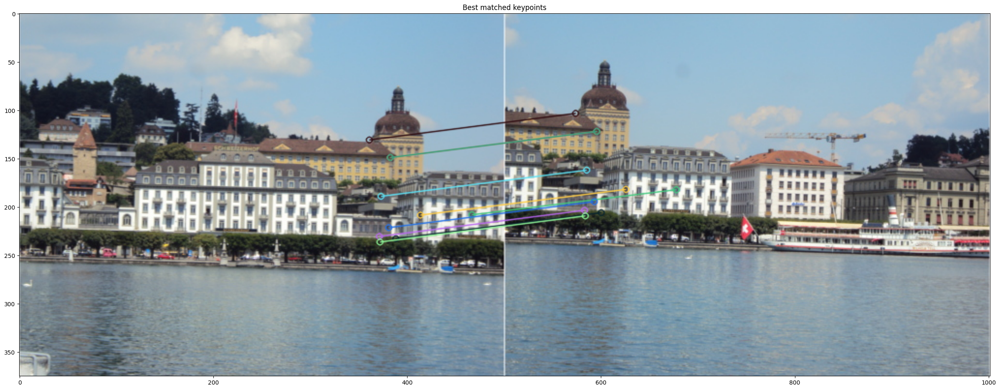

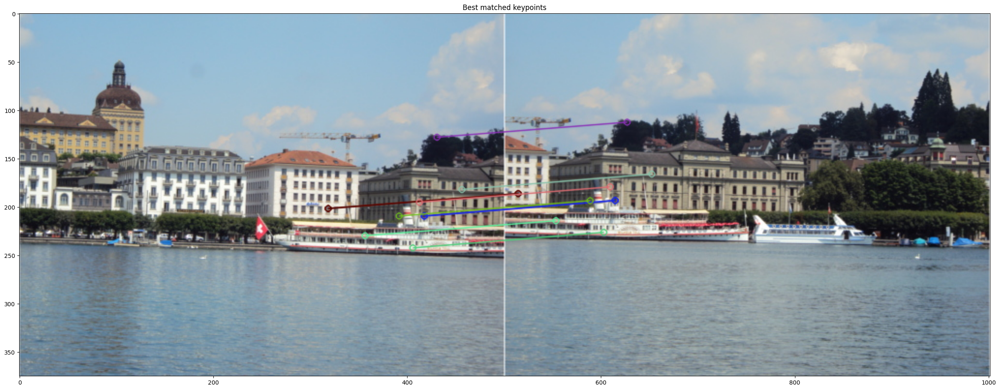

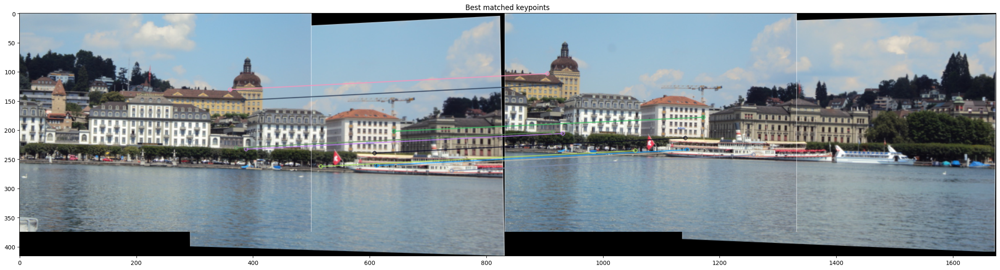

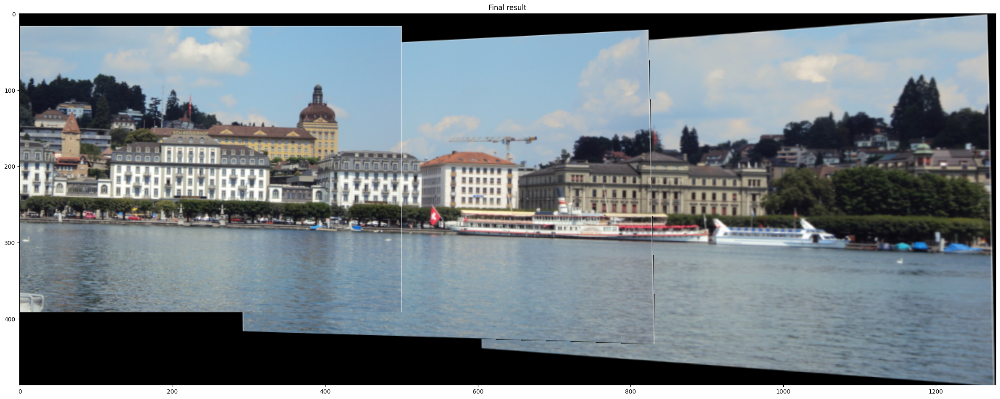

In [48]:
from glob import glob

result = stitch_panorama(*glob("*.jpg"))

cv2.imwrite('result.png', result)
plot_images(result, title='Final result')
